In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os

if not getattr(sys, "_src_path_added", False):
    src_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
    if src_path not in sys.path:
        sys.path.insert(0, src_path)
    sys._src_path_added = True 

In [2]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import MTGA.GeneMutators as GeneMutators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *
from MTGA.MTGAUtils import *

## Main Instance

In [3]:
instance = Instance("../problems/p2.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.TruncatedNormal(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights(),
    gene_mutator=GeneMutators.Normal())

problem size 7
fire starts [1]
num teams 2


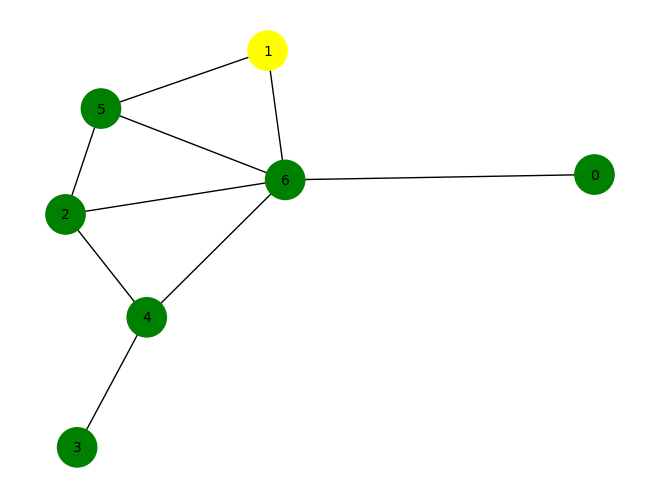

In [4]:
print("problem size", instance.size)
print("fire starts", instance.problem.fire_starts)
print("num teams", instance.problem.num_teams)
draw_graph(instance.problem)

In [5]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [6]:
data = optimize_and_collect(instance)

[2025-02-09 18:23:05][  0]     0.06563497     0.06551957 {  2.00000000   8.28200000  28.00000000   6.65571003}
[2025-02-09 18:23:05][  1]     0.12954211     0.06174040 {  2.00000000   9.30200000  28.00000000   7.20879990}
[2025-02-09 18:23:05][  2]     0.18713021     0.05423951 {  2.00000000  10.77200000  28.00000000   8.79704587}
[2025-02-09 18:23:05][  3]     0.24687171     0.05805135 {  2.00000000  12.65800000  28.00000000   9.39537312}
[2025-02-09 18:23:05][  4]     0.30640769     0.05790019 {  2.00000000  14.93000000  28.00000000  10.17453193}
[2025-02-09 18:23:05][  5]     0.36299419     0.05431414 {  2.00000000  15.99200000  28.00000000  10.17152575}
[2025-02-09 18:23:05][  6]     0.43358159     0.06853032 {  2.00000000  18.50200000  28.00000000  10.04440123}
[2025-02-09 18:23:05][  7]     0.47972631     0.04402614 {  2.00000000  20.94400000  28.00000000   9.39983319}
[2025-02-09 18:23:05][  8]     0.52499151     0.04376554 {  2.00000000  22.56000000  28.00000000   8.76871712}
[

In [7]:
solutions = correct_solutions(instance)

## Results

In [8]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [4]:
[5, 6]


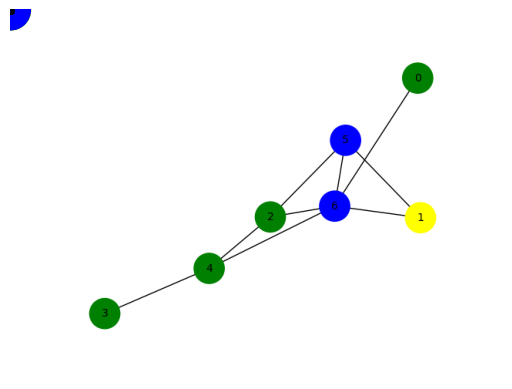

In [9]:
instance.problem.visualize_fire_without_burned(displayer, best_solution)

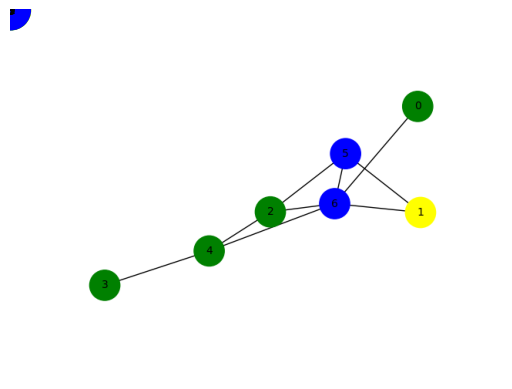

In [10]:
instance.problem.visualize_fires(displayer, solutions)

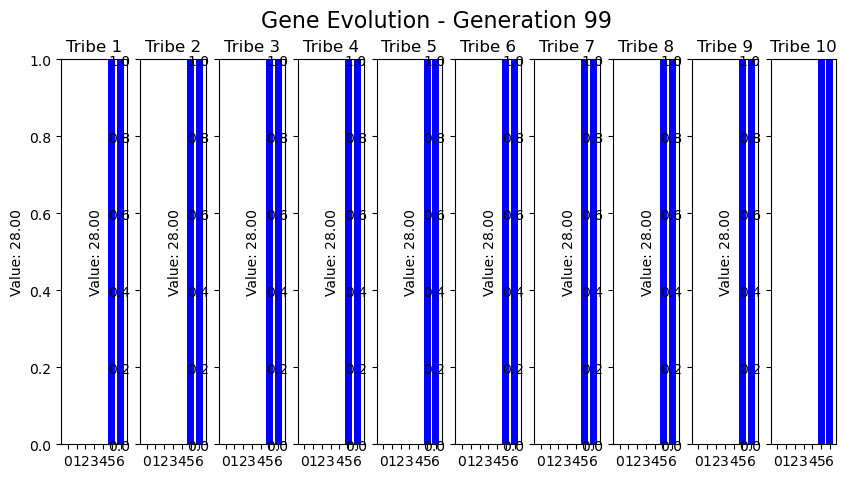

In [11]:
gene_displayer.visualize(data)

## Instance 200

data collected


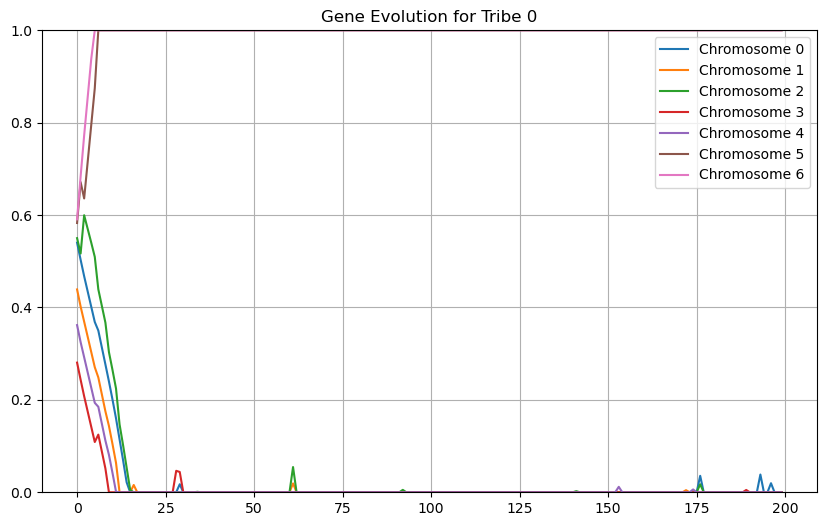

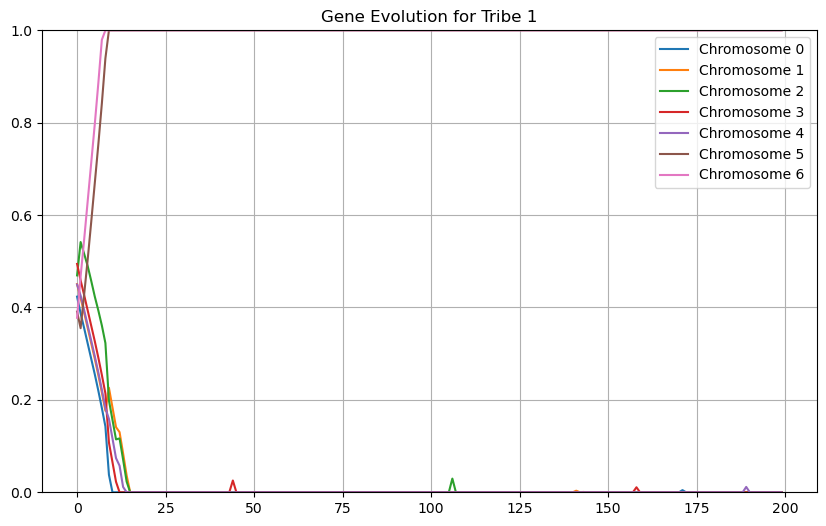

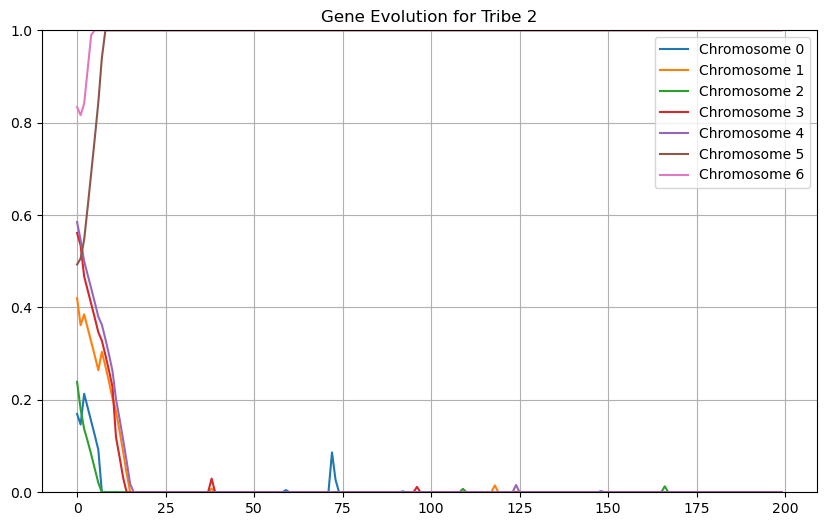

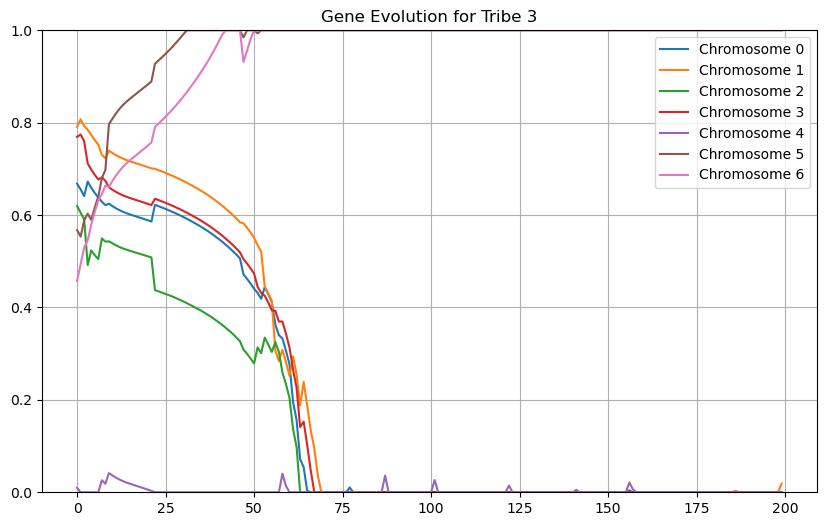

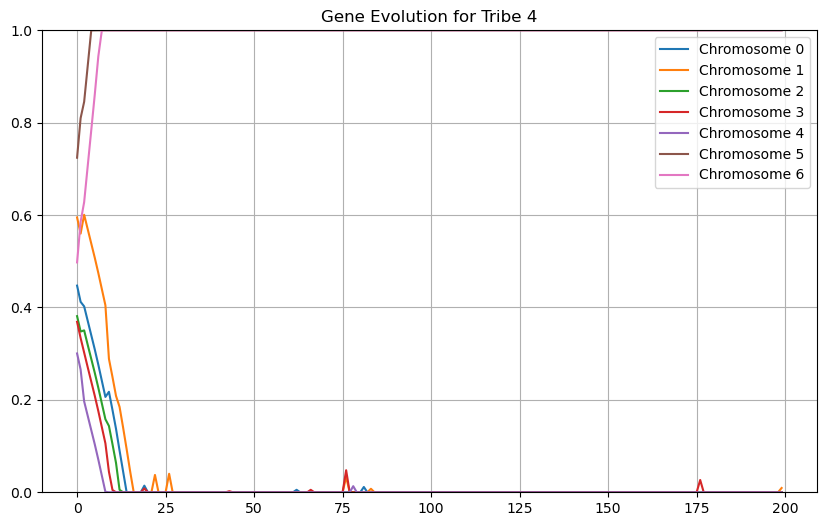

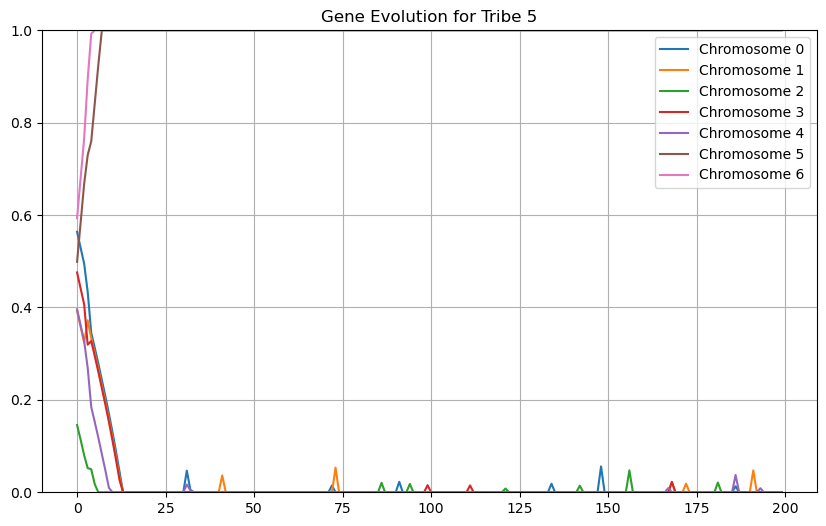

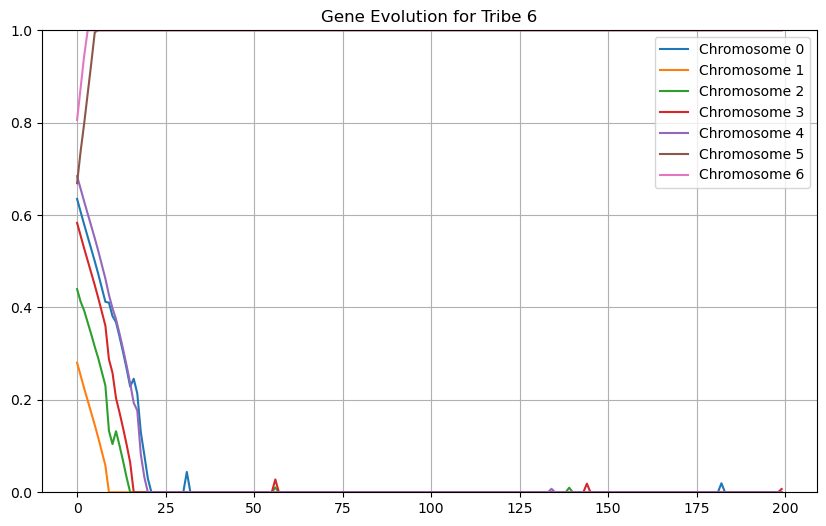

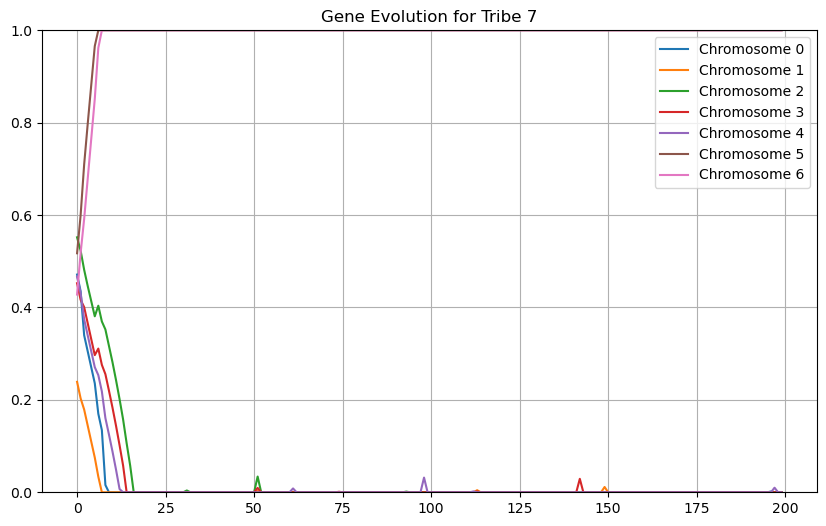

In [12]:
data200, instance200 = collect_and_visualize("../problems/p2.json", local_step_size=0.03, sigma=0.04)

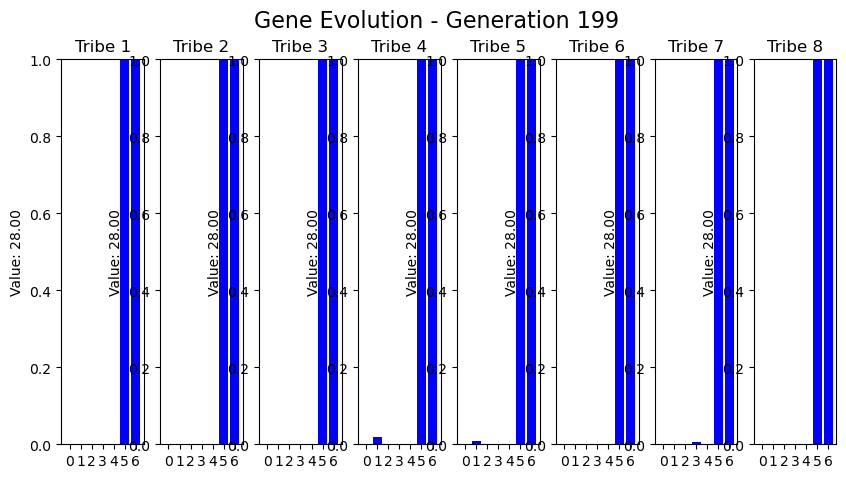

In [13]:
gene_displayer.visualize(data200)

In [14]:
solutions = correct_solutions(instance200)

In [15]:
best_solution_200, best_solutions_value_200 = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value_200}]:\n{best_solution_200}")

Best solution [4]:
[5, 6]
